<h1>COSIpy with continuum response</h1>

In [1]:
from COSIpy import *
import response
from fit import fit
plt.style.use('thomas')

Welcome to JupyROOT 6.22/02


/usr/local/Cellar/python/3.7.7/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
plt.style.use('thomas')

<h3>Data set (simulation): flat spectrum between 100 and 5000 keV at ~zenith without background:<br><br>
$S(E) = Crab$</h3>

In [3]:
data_dir = '/Users/thomassiegert/data/COSI/Simulations/Crab/'
filename1 = 'Crab_F10C_Z00_wBG.inc1.id1_CE0000-5000keV.tra.gz'
filename2 = 'Crab_F10C_Z18_wBG.inc1.id1_CE0000-5000keV.tra.gz'
filename3 = 'Crab_F10C_Z36_wBG.inc1.id1_CE0000-5000keV.tra.gz'
filename4 = 'Crab_F10C_Z54_wBG.inc1.id1_CE0000-5000keV.tra.gz'

<h3>COSIpy work flow:</h3>

In [4]:
# create analysis object
analysis1 = COSIpy(data_dir,filename1)
analysis2 = COSIpy(data_dir,filename2)
analysis3 = COSIpy(data_dir,filename3)
analysis4 = COSIpy(data_dir,filename4)

In [5]:
# read in data (tra file)
analysis1.read_COSI_DataSet()
analysis2.read_COSI_DataSet()
analysis3.read_COSI_DataSet()
analysis4.read_COSI_DataSet()

Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z00.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z18.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z36.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/Crab/Crab_F10C_Z54.inc1.id1_CE0000-5000keV.tra.gz
Switched to file /Users/thomassiegert/data/COSI/Simulations/BG_from_despina/ConstantBG_9dets_stare.p1.inc1.id1_CE0000-5000keV.tra.gz


In [6]:
# define everything in one time bin
Delta_T = 86400
analysis1.dataset.time_binning_tags(time_bin_size=Delta_T)
analysis2.dataset.time_binning_tags(time_bin_size=Delta_T)
analysis3.dataset.time_binning_tags(time_bin_size=Delta_T)
analysis4.dataset.time_binning_tags(time_bin_size=Delta_T)

In [7]:
# definition of energy bins (exactly as response right now)
energy_bin_edges=np.array([150,  220,  325,  480,  520,  765, 1120, 1650, 2350, 3450, 5000])

In [8]:
energy_bin_edges

array([ 150,  220,  325,  480,  520,  765, 1120, 1650, 2350, 3450, 5000])

In [9]:
# define energy and pixel binning
pixel_size = 6.
analysis1.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)
analysis2.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)
analysis3.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)
analysis4.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)

In [10]:
# bin data
analysis1.dataset.get_binned_data()
analysis2.dataset.get_binned_data()
analysis3.dataset.get_binned_data()
analysis4.dataset.get_binned_data()

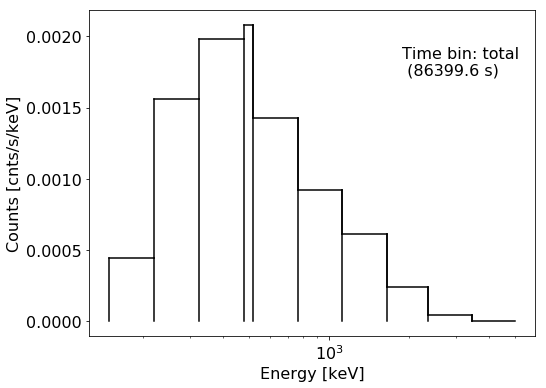

In [11]:
analysis3.dataset.plot_raw_spectrum()
plt.xscale('log')

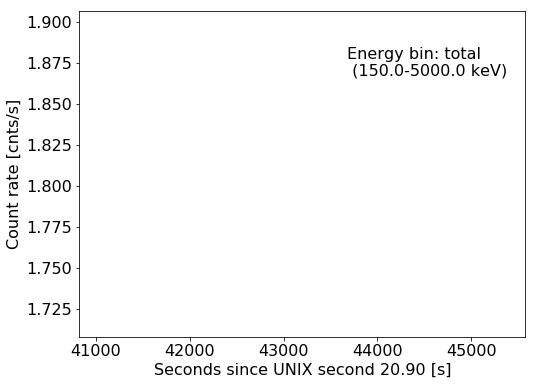

In [12]:
# light curve
analysis3.dataset.plot_lightcurve()

In [13]:
# definition of poitings (balloon stability + Earth rotation)
pointing1 = Pointing(dataset=analysis1.dataset,)
pointing2 = Pointing(dataset=analysis2.dataset,)
pointing3 = Pointing(dataset=analysis3.dataset,)
pointing4 = Pointing(dataset=analysis4.dataset,)

Text(0, 0.5, 'Zenith [deg]')

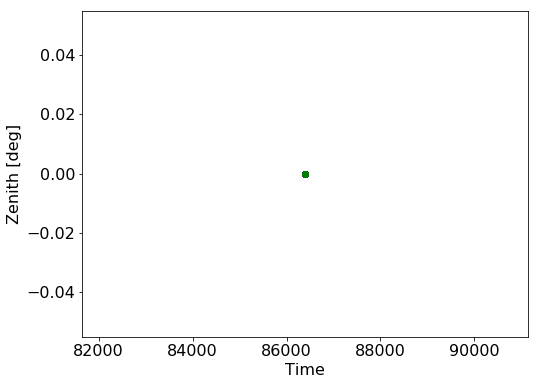

In [14]:
plt.plot(pointing1.cdtpoins,pointing1.zpoins[:,1],'o-')
plt.plot(pointing2.cdtpoins,pointing2.zpoins[:,1],'o-')
plt.plot(pointing3.cdtpoins,pointing3.zpoins[:,1],'o-')
plt.plot(pointing4.cdtpoins,pointing4.zpoins[:,1],'o-')
plt.xlabel('Time')
plt.ylabel('Zenith [deg]')

In [15]:
# background
background1 = BG(dataset=analysis1.dataset,mode='sim 6deg despina')
background2 = BG(dataset=analysis2.dataset,mode='sim 6deg despina')
background3 = BG(dataset=analysis3.dataset,mode='sim 6deg despina')
background4 = BG(dataset=analysis4.dataset,mode='sim 6deg despina')

Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...
Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...
Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...
Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...


In [16]:
# source position definition
l1,b1 = 180,0
l2,b2 = 180,18
l3,b3 = 180,-36
l4,b4 = 180,54

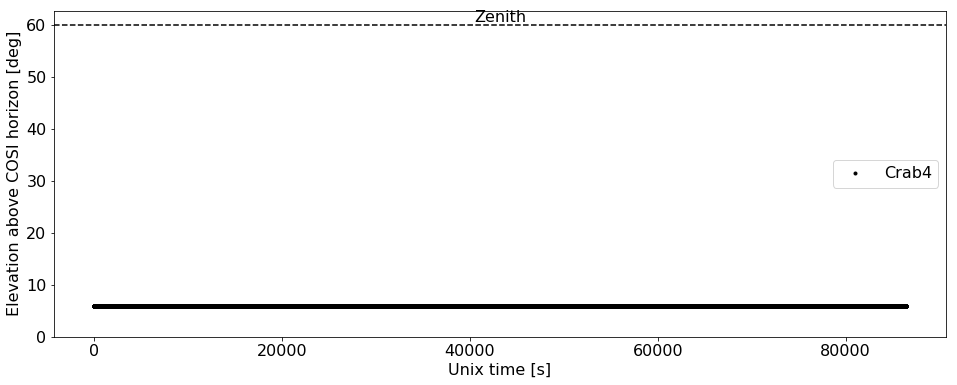

In [17]:
# plot elevation
analysis4.plot_elevation([l4],[b4],['Crab4'])

<h3>Reading in response (quite large, though)</h3>

In [18]:
rsp = response.SkyResponse(filename='response/RegularResponseGrid_Continuum_10bins_v1.npz',pixel_size=6)

Reading complete continuum response. This might take a while...
Done.

Creating general RMF matrices, stay tuned...



Done.

Creating general IRF. Wait for it...
Done.

Deleting full matrix.
Done. Now have fun.


In [19]:
rsp.rsp.response_grid_normed_efinal.shape

(30, 60, 30, 1145, 10)

<h3>Calculate response for a point source at the known position</h3>

In [20]:
rsp.calculate_PS_response(analysis1.dataset,
                          pointing1,l1,b1,1,
                          background=background1,
                          pixel_size=pixel_size)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...



Done.

Calculating averaged RMF for object at (l,b) = (180.0,0.0)


<h3>Fit to data to extract counts per unit time and energy:</h3>

In [21]:
result1 = fit(analysis1.dataset,
              pointing1,
              rsp,
              background1,
              #priors=np.array([[1e-6,1e8],[1e-6,1e4]]), # sky unconstrained, BG ~ 0
              verbose=True)

result1.MAP_solution(scipy=False)

Start optimising energy bin 1/10...

Energy range: 150-220 keV ...
Start optimising energy bin 2/10...

Energy range: 220-325 keV ...
Start optimising energy bin 3/10...

Energy range: 325-480 keV ...
Start optimising energy bin 4/10...

Energy range: 480-520 keV ...
Start optimising energy bin 5/10...

Energy range: 520-765 keV ...
Start optimising energy bin 6/10...

Energy range: 765-1120 keV ...
Start optimising energy bin 7/10...

Energy range: 1120-1650 keV ...
Start optimising energy bin 8/10...

Energy range: 1650-2350 keV ...
Start optimising energy bin 9/10...

Energy range: 2350-3450 keV ...
Start optimising energy bin 10/10...

Energy range: 3450-5000 keV ...

Initial log joint probability = 3640.83
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      11       3645.92    0.00489695    0.00254246           1           1       16   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tole

<h3>Reading in "sky-only" simulation to compare extraction:</h3>

In [22]:
filename1sky = 'Crab_F10C_Z00.inc1.id1_CE0000-5000keV.tra.gz'
filename2sky = 'Crab_F10C_Z18.inc1.id1_CE0000-5000keV.tra.gz'
filename3sky = 'Crab_F10C_Z36.inc1.id1_CE0000-5000keV.tra.gz'
filename4sky = 'Crab_F10C_Z54.inc1.id1_CE0000-5000keV.tra.gz'

In [24]:
sky_filename1 = filename1
sky_data1 = COSIpy(data_dir,filename1sky)
sky_data1.read_COSI_DataSet()
sky_data1.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data1.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data1.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate1 = np.sum(sky_data1.dataset.binned_data,axis=(0,2,3))/\
                (sky_data1.dataset.energies.energy_bin_wid*2*sky_data1.dataset.times.total_time)

In [25]:
sky_filename2 = filename2
sky_data2 = COSIpy(data_dir,filename2sky)
sky_data2.read_COSI_DataSet()
sky_data2.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data2.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data2.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate2 = np.sum(sky_data2.dataset.binned_data,axis=(0,2,3))/\
                (sky_data2.dataset.energies.energy_bin_wid*2*sky_data2.dataset.times.total_time)

In [26]:
sky_filename3 = filename3
sky_data3 = COSIpy(data_dir,filename3sky)
sky_data3.read_COSI_DataSet()
sky_data3.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data3.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data3.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate3 = np.sum(sky_data3.dataset.binned_data,axis=(0,2,3))/\
                (sky_data3.dataset.energies.energy_bin_wid*2*sky_data3.dataset.times.total_time)

In [27]:
sky_filename4 = filename4
sky_data4 = COSIpy(data_dir,filename4sky)
sky_data4.read_COSI_DataSet()
sky_data4.dataset.time_binning_tags(time_bin_size=Delta_T) # everything in one time bin
sky_data4.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=6.)
sky_data4.dataset.get_binned_data()
# pure sky count rate
sim_sky_rate4 = np.sum(sky_data4.dataset.binned_data,axis=(0,2,3))/\
                (sky_data4.dataset.energies.energy_bin_wid*2*sky_data4.dataset.times.total_time)

In [28]:
n_e = analysis1.dataset.energies.n_energy_bins

In [29]:
from COSIpy_tools import step_plot

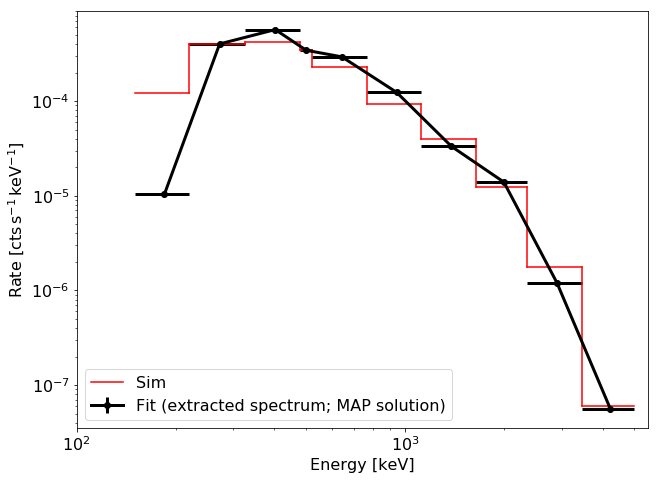

In [30]:
# fit
result1.plot_MAP_spectrum()
# simulation
step_plot(rsp.e_edges,sim_sky_rate1,color='red',plot_label='Sim') 
plt.legend()

<h3>Perfect fit (by definition).<br><br>
    Now estimating error bars:</h3>

In [31]:
result1.fit(iters=1000)

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...
Summary for energy bin 1/10:

Inference for Stan model: anon_model_666f42d8e949bfaf2d5a9470c57200bd.
1 chains, each with iter=1000; warmup=500; thin=1; 
post-warmup draws per chain=500, total post-warmup draws=500.

          mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
flux[1] 153.53    8.66  97.33   14.9   75.4 144.04 226.29  359.4    126    1.0
Abg[1]    0.95  3.4e-3   0.04   0.87   0.92   0.95   0.97   1.01    123    1.0

Samples were drawn using NUTS at Thu Jan 14 16:33:55 2021.
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-32

###################################################################


Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 700 / 1000 [ 70%]  (Sampling)
Iteration: 800 / 1000 [ 80%]  (Sampling)
Iteration: 900 / 1000 [ 90%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 0.587393 seconds (Warm-up)
               0.443324 seconds (Sampling)
               1.03072 seconds (Total)


Gradient evaluation took 0.00012 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.2 seconds.
Adjust your expectations accordingly!



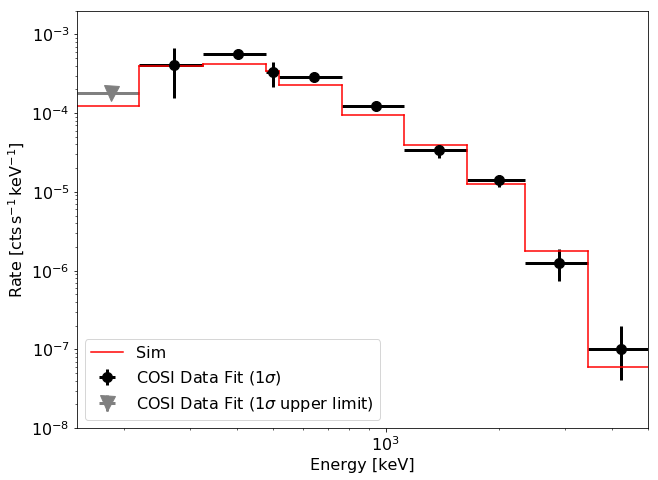

In [34]:
# fit
result1.plot_extracted_spectrum(ul=1,with_systematics=True)
# simulation
step_plot(rsp.e_edges,sim_sky_rate1,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [35]:
rsp.calculate_PS_response(analysis2.dataset,
                          pointing2,l2,b2,1,
                          background=background2,
                          pixel_size=pixel_size,)

result2 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background2,
              #priors=np.array([[1e-6,1e8],[1e-6,1e8]]),
              verbose=True)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...



Done.

Calculating averaged RMF for object at (l,b) = (180.0,18.0)


In [36]:
result2.fit(iters=1000)

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...
Summary for energy bin 1/10:

Inference for Stan model: anon_model_666f42d8e949bfaf2d5a9470c57200bd.
1 chains, each with iter=1000; warmup=500; thin=1; 
post-warmup draws per chain=500, total post-warmup draws=500.

          mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
flux[1] 241.51    9.89  116.9  43.12  149.6 235.64  326.4 468.04    140    1.0
Abg[1]    0.92  3.7e-3   0.04   0.84   0.88   0.92   0.95    1.0    136    1.0

Samples were drawn using NUTS at Thu Jan 14 16:34:54 2021.
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-32

convergence, Rhat=1).
###################################################################


Gradient evaluation took 0.000114 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.14 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 700 / 1000 [ 70%]  (Sampling)
Iteration: 800 / 1000 [ 80%]  (Sampling)
Iteration: 900 / 1000 [ 90%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 0.539955 seconds (Warm-up)
               0.385937 seconds (Sampling)
               0.925892 seconds (Total)


Gradient evaluation took 0.000129 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.29 seconds.
Adjust your e

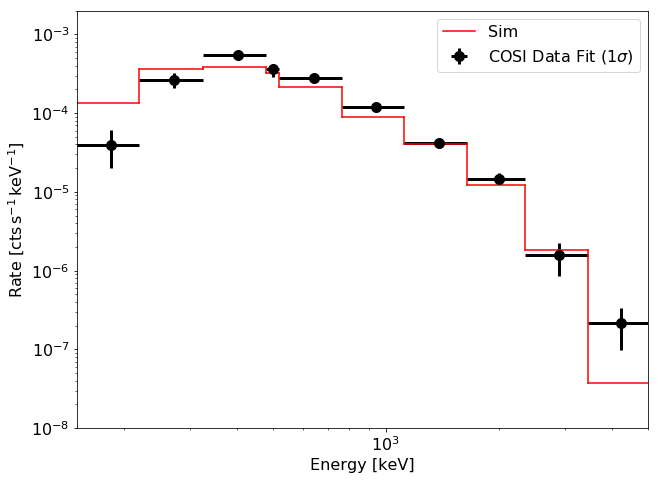

In [40]:
# fit
result2.plot_extracted_spectrum()#ul=2,with_systematics=True)
# simulation
step_plot(rsp.e_edges,sim_sky_rate2,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [41]:
rsp.calculate_PS_response(analysis3.dataset,
                          pointing3,l3,b3,1,
                          background=background3,
                          pixel_size=pixel_size,)

result3 = fit(analysis3.dataset,
              pointing3,
              rsp,
              background3,
              #priors=np.array([[1e-6,1e8],[1e-6,1e8]]),
              verbose=True)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...



Done.

Calculating averaged RMF for object at (l,b) = (180.0,-36.0)


In [42]:
result3.fit(iters=1000)

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...
Summary for energy bin 1/10:

Inference for Stan model: anon_model_666f42d8e949bfaf2d5a9470c57200bd.
1 chains, each with iter=1000; warmup=500; thin=1; 
post-warmup draws per chain=500, total post-warmup draws=500.

          mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
flux[1]  197.8   10.52 116.53  11.81 104.47 187.44 280.97 447.78    123   1.01
Abg[1]    0.93  4.1e-3   0.05   0.83   0.89   0.93   0.96   1.01    127   1.01

Samples were drawn using NUTS at Thu Jan 14 16:35:57 2021.
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-32

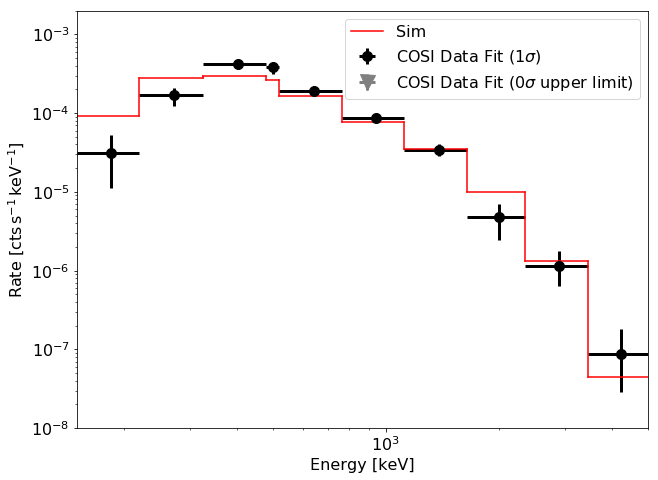

In [43]:
# fit
result3.plot_extracted_spectrum(ul=0)
# simulation
step_plot(rsp.e_edges,sim_sky_rate3,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [44]:
rsp.calculate_PS_response(analysis4.dataset,
                          pointing4,l4,b4,1,
                          background=background4,
                          pixel_size=pixel_size)

result4 = fit(analysis4.dataset,
              pointing4,
              rsp,
              background4,
              #priors=np.array([[1e-6,1e8],[1e-6,1e-8]]),
              verbose=True)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...



Done.

Calculating averaged RMF for object at (l,b) = (180.0,54.0)


In [45]:
result4.fit(iters=1000)

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...
Summary for energy bin 1/10:

Inference for Stan model: anon_model_666f42d8e949bfaf2d5a9470c57200bd.
1 chains, each with iter=1000; warmup=500; thin=1; 
post-warmup draws per chain=500, total post-warmup draws=500.

          mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
flux[1] 117.34    9.94  85.23   2.38  50.07 106.52 165.54 306.93     74    1.0
Abg[1]    0.95  4.5e-3   0.04   0.85   0.93   0.96   0.98   1.02     82    1.0

Samples were drawn using NUTS at Thu Jan 14 16:37:20 2021.
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-32

convergence, Rhat=1).
###################################################################


Gradient evaluation took 7.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.79 seconds.
Adjust your expectations accordingly!


Iteration:   1 / 1000 [  0%]  (Warmup)
Iteration: 100 / 1000 [ 10%]  (Warmup)
Iteration: 200 / 1000 [ 20%]  (Warmup)
Iteration: 300 / 1000 [ 30%]  (Warmup)
Iteration: 400 / 1000 [ 40%]  (Warmup)
Iteration: 500 / 1000 [ 50%]  (Warmup)
Iteration: 501 / 1000 [ 50%]  (Sampling)
Iteration: 600 / 1000 [ 60%]  (Sampling)
Iteration: 700 / 1000 [ 70%]  (Sampling)
Iteration: 800 / 1000 [ 80%]  (Sampling)
Iteration: 900 / 1000 [ 90%]  (Sampling)
Iteration: 1000 / 1000 [100%]  (Sampling)

 Elapsed Time: 0.590872 seconds (Warm-up)
               0.286662 seconds (Sampling)
               0.877534 seconds (Total)


Gradient evaluation took 0.000117 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.17 seconds.
Adjust your ex

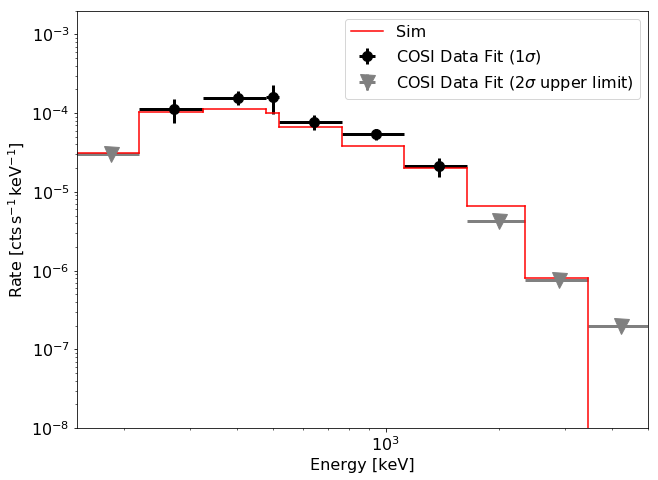

In [49]:
# fit
result4.plot_extracted_spectrum(ul=2)
# simulation
step_plot(rsp.e_edges,sim_sky_rate4,color='red',plot_label='Sim') 

plt.xlim(150,5000)
plt.ylim(1e-8,2e-3)
plt.legend()

In [50]:
rsp.calculate_PS_response(analysis1.dataset,
                          pointing1,l1,b1,1,
                          background=background1,
                          pixel_size=pixel_size)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...



Done.

Calculating averaged RMF for object at (l,b) = (180.0,0.0)


<h3>How to fit this count rate spectrum to get spectral parameter in physical (model) space: (cf. presentation)</h3>

In [51]:
from spectral_shapes import *

<h3>$\mathrm{ph\,s^{-1}\,cm^{-2}\,keV^{-1}} \Rightarrow \mathrm{ph\,s^{-1}\,cm^{-2}}$:</h3>

In [52]:
crab_params = np.array([3.90e-6,-2.23,100,5000])

In [53]:
prior_crab = {0: ('truncated_normal_prior',1e-9,1e8,0,np.inf,r'$C_0$'),
              1: ('normal_prior',-2.0,5.0,r'$\alpha$')}
function = 'powerlaw'

In [54]:
result1.fit_spectrum(function,prior_crab,e_select=np.arange(10),with_systematics=True)

  8%|▊         | 161/2000 [00:00<00:02, 803.79it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 2000/2000 [00:01<00:00, 1114.13it/s]


Processing took 1.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  4.84e-06  2.63e-07  4.04e-06  4.57e-06  4.84e-06  5.10e-06  5.59e-06
 $\alpha$: -2.35e+00  9.12e-02 -2.64e+00 -2.44e+00 -2.34e+00 -2.26e+00 -2.07e+00


Chi2 (dof): 8.0 (8)


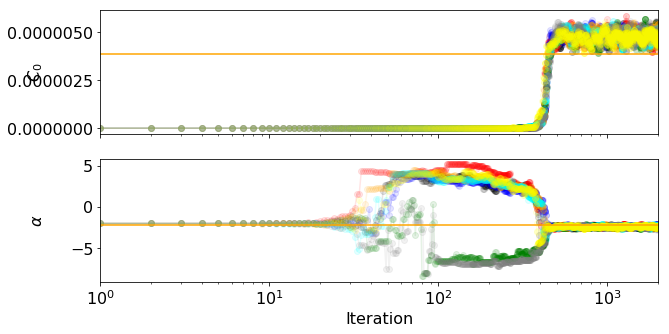

In [60]:
result1.plot_parameter_chains(truths=list(crab_params))

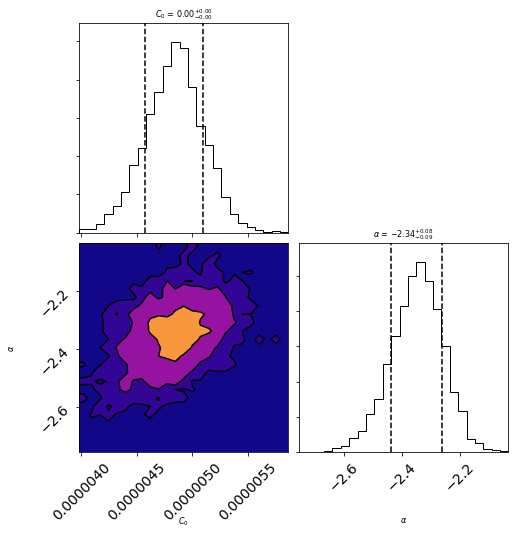

In [63]:
result1.corner_plot(truths=list(crab_params))

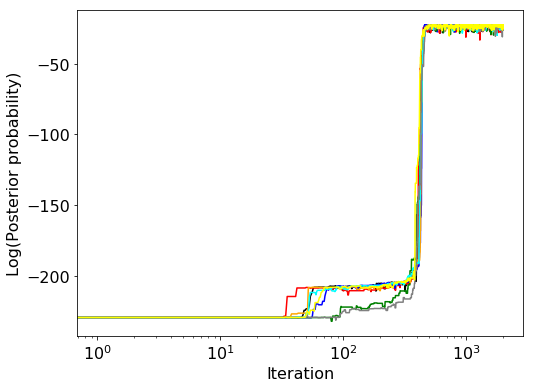

In [64]:
result1.plot_posterior_chains()

In [65]:
result1.calculate_model_posteriors()

14000 16000


(1e-08, 0.0012017018710837925)

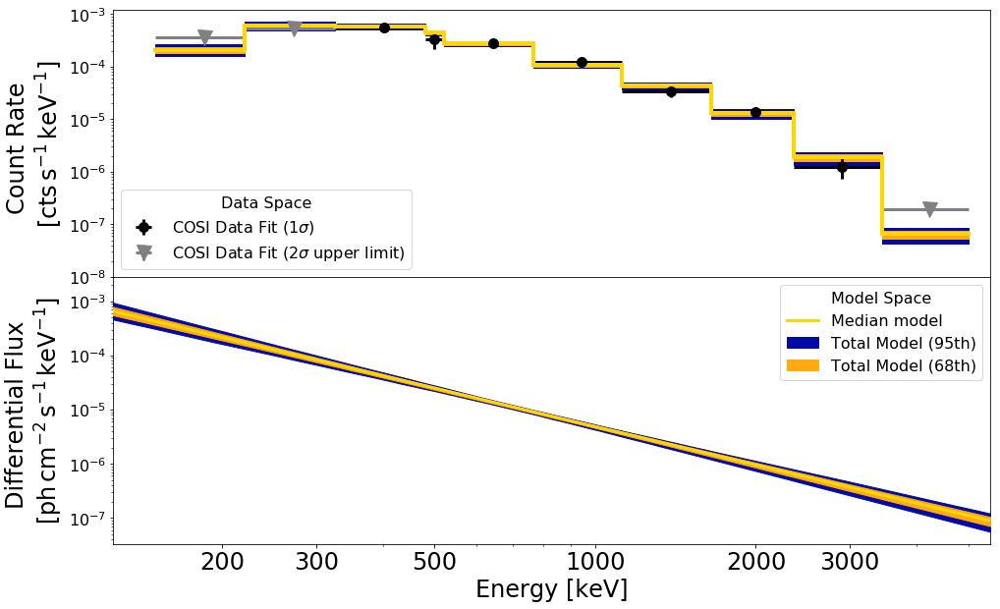

In [66]:
pc = result1.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=2)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [71]:
result2.fit_spectrum(function,prior_crab,e_select=np.arange(10),with_systematics=True,iters=5000,)

  2%|▏         | 81/5000 [00:00<00:06, 807.50it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 5000/5000 [00:04<00:00, 1064.89it/s]


Processing took 4.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  4.93e-06  2.35e-07  4.18e-06  4.70e-06  4.93e-06  5.16e-06  5.62e-06
 $\alpha$: -2.27e+00  8.70e-02 -2.55e+00 -2.36e+00 -2.27e+00 -2.19e+00 -2.00e+00


Chi2 (dof): 5.9 (8)


In [72]:
result2.calculate_model_posteriors()

38000 40000


(1e-08, 0.0011073747194468163)

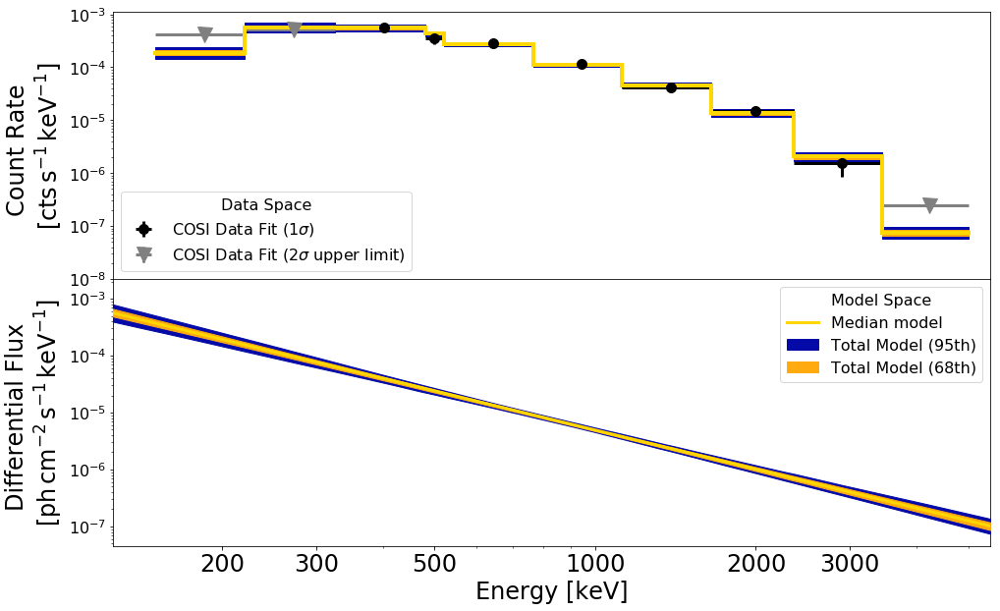

In [73]:
pc = result2.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=2)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [74]:
result3.fit_spectrum(function,prior_crab,e_select=np.arange(10),with_systematics=True,iters=5000,)

  2%|▏         | 80/5000 [00:00<00:06, 789.58it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 5000/5000 [00:05<00:00, 969.57it/s] 


Processing took 5.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  3.44e-06  2.19e-07  2.79e-06  3.22e-06  3.44e-06  3.66e-06  4.09e-06
 $\alpha$: -2.39e+00  1.15e-01 -2.73e+00 -2.51e+00 -2.39e+00 -2.27e+00 -2.07e+00


Chi2 (dof): 7.6 (8)


In [75]:
result3.calculate_model_posteriors()

38000 40000


(1e-08, 0.0009341046791080486)

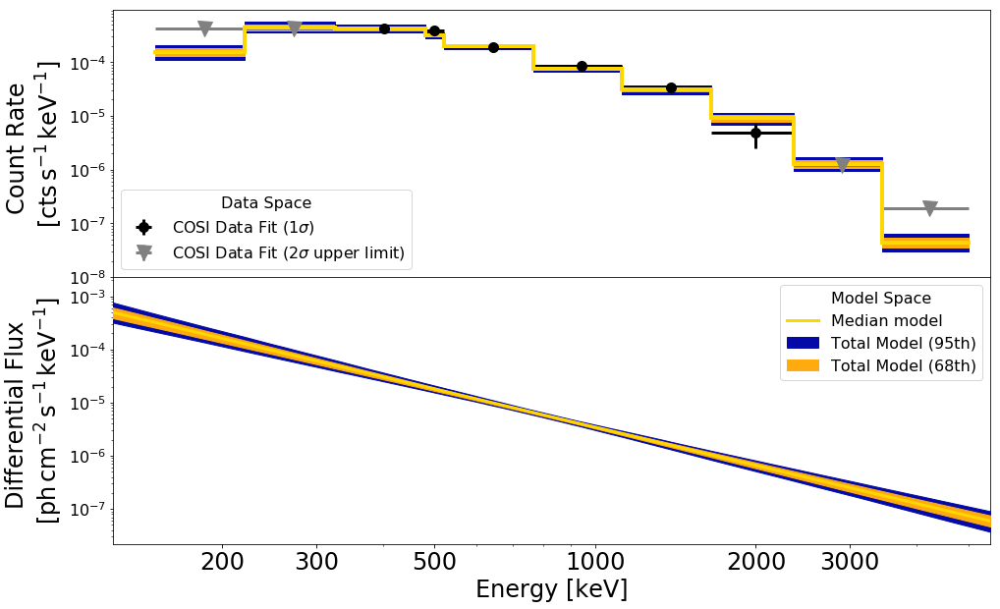

In [76]:
pc = result3.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=2)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [77]:
result4.fit_spectrum(function,prior_crab,e_select=np.arange(10),with_systematics=True,iters=5000,)

  2%|▏         | 77/5000 [00:00<00:06, 767.15it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 5000/5000 [00:05<00:00, 906.09it/s] 


Processing took 5.5 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  1.60e-06  1.98e-07  9.96e-07  1.41e-06  1.61e-06  1.80e-06  2.18e-06
 $\alpha$: -2.25e+00  1.91e-01 -2.88e+00 -2.44e+00 -2.25e+00 -2.06e+00 -1.73e+00


Chi2 (dof): 10.1 (8)


In [78]:
result4.calculate_model_posteriors()

38000 40000


(1e-08, 0.0006075862122841088)

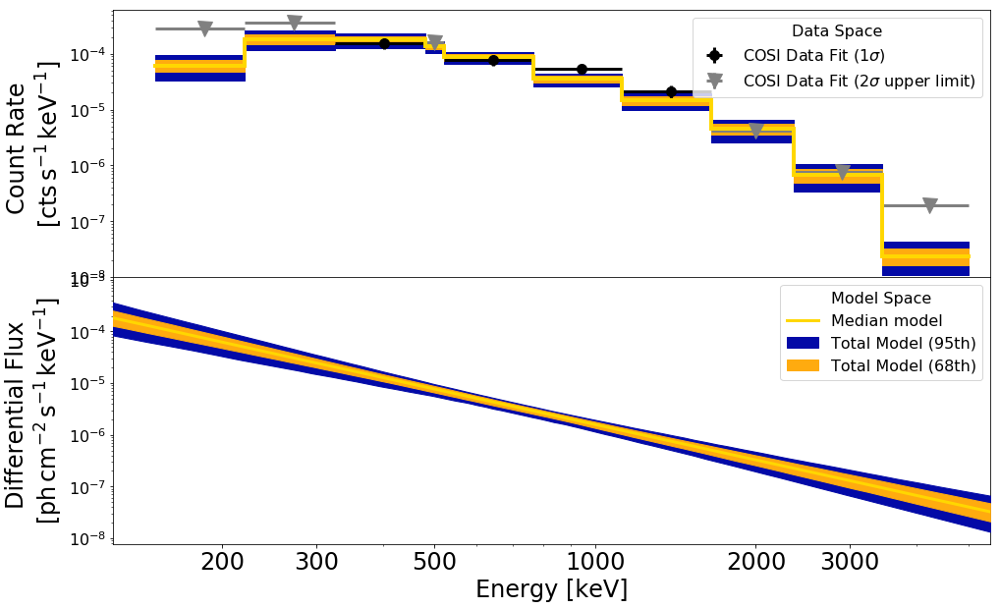

In [79]:
pc = result4.plot_posterior_spectrum(model_mode='flux',with_systematics=True,ul=2)
pc[0].set_ylim(1e-8,)

#pc[0].set_xscale('linear')
#pc[1].set_yscale('linear')

In [80]:
l_gridg = np.linspace(180-75,180+75,14)
b_gridg = np.linspace(0-75,0+75,14)

l_grid = l_gridg[0:-1]+np.diff(l_gridg[0:-1])[0]/2
b_grid = b_gridg[0:-1]+np.diff(b_gridg[0:-1])[0]/2

l_grid[l_grid<-180] += 360

L_GRIDg, B_GRIDg = np.meshgrid(l_gridg,b_gridg)
L_GRID, B_GRID = np.meshgrid(l_grid,b_grid)

In [81]:
result1.TS_map([L_GRID,B_GRID],scipy=False)

Fitting background only...


Now fitting object at (l,b) = (110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -69.23076923076923
Now fitting object at (l,b) = (122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -69.23076923076923
Now fitting object at (l,b) = (133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -69.23076923076923
Now fitting object at (l,b) = (145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -69.23076923076923
Now fitting object at (l,b) = (156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -69.23076923076923
Now fitting object at (l,b) = (168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 -69.23076923076923
Now fitting object at (l,b) = (180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-69.2)


Something went wrong with the fit, ignoring grid point  180.0 -69.23076923076923
Now fitting object at (l,b) = (191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 -69.23076923076923
Now fitting object at (l,b) = (203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -69.23076923076923
Now fitting object at (l,b) = (214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -69.23076923076923
Now fitting object at (l,b) = (226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -69.23076923076923
Now fitting object at (l,b) = (237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -69.23076923076923
Now fitting object at (l,b) = (249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -69.23076923076923
Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -57.69230769230769
Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -57.69230769230769
Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -57.69230769230769
Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -57.69230769230769
Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -57.69230769230769
Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -57.69230769230769
Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -57.69230769230769
Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -57.69230769230769
Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -57.69230769230769
Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -57.69230769230769
Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -46.153846153846146
Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -46.153846153846146
Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -46.153846153846146
Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -46.153846153846146
Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -46.153846153846146
Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -46.153846153846146
Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -34.61538461538461
Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -34.61538461538461
Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -34.61538461538461
Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -34.61538461538461
Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -23.076923076923077
Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -23.076923076923077
Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -23.076923076923077
Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -23.076923076923077
Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -11.538461538461537
Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -11.538461538461537
Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -3.552713678800501e-15
Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -3.552713678800501e-15
Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 11.538461538461544
Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 11.538461538461544
Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 23.076923076923077
Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 23.076923076923077
Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 23.076923076923077
Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 23.076923076923077
Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 34.61538461538461
Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 34.61538461538461
Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 34.61538461538461
Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 34.61538461538461
Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 46.15384615384616
Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 46.15384615384616
Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 46.15384615384616
Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 46.15384615384616
Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 46.15384615384616
Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 46.15384615384616
Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 57.69230769230769
Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 57.69230769230769
Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 57.69230769230769
Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 57.69230769230769
Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 57.69230769230769
Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 57.69230769230769
Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 57.69230769230769
Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 57.69230769230769
Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 57.69230769230769
Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 57.69230769230769
Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 69.23076923076923
Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 69.23076923076923
Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 69.23076923076923
Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 69.23076923076923
Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 69.23076923076923
Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 69.23076923076923
Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Something went wrong with the fit, ignoring grid point  180.0 69.23076923076923
Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 69.23076923076923
Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 69.23076923076923
Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 69.23076923076923
Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 69.23076923076923
Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 69.23076923076923
Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 69.23076923076923

Initial log joint probability = 3645.68
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       3645.82    0.00995047   0.000384966   0.0003476       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 28051
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       28051.7     0.0100311      0.231245   6.534e-05       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 56228.8
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       56230.2     0.0100038       1.50588    3.55e-05       0.001        3   
Optimization terminated normally: 
  Co

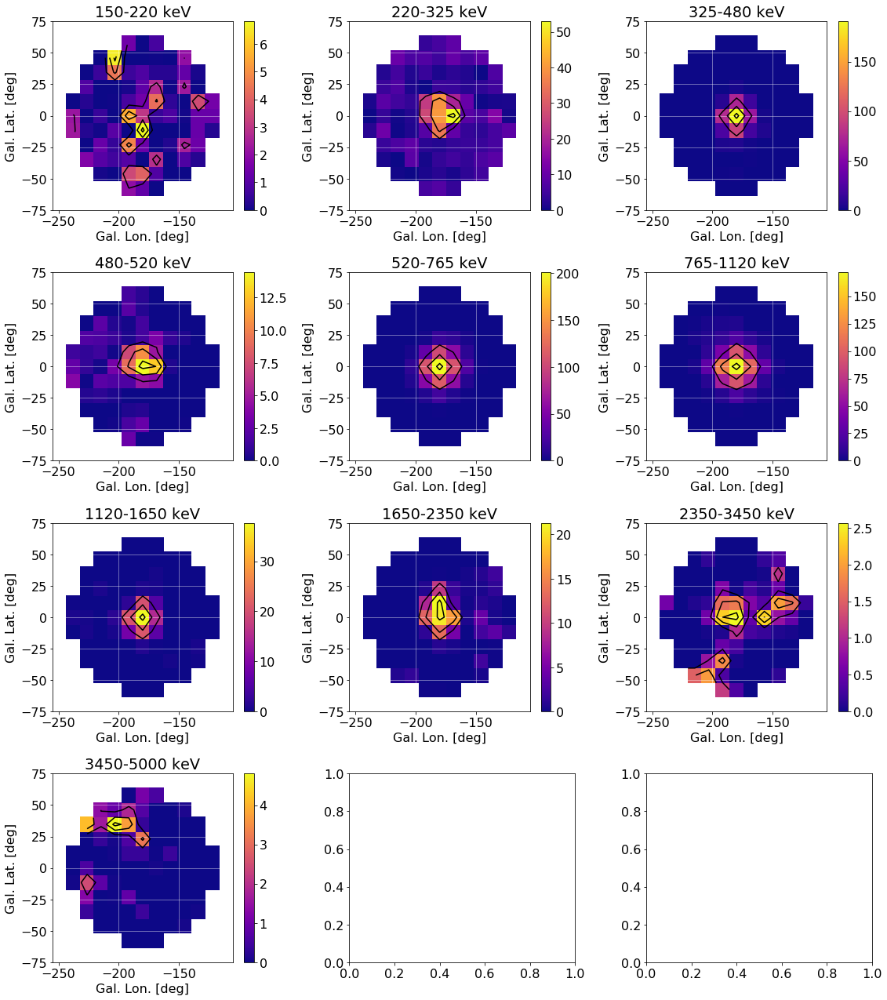

In [82]:
pc = result1.plot_TS_map_results()

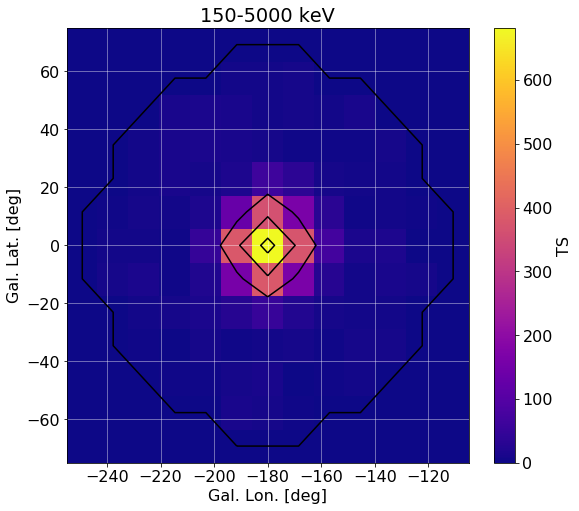

In [83]:
result1.plot_TS_map_results(mode='sum')

In [84]:
result2.TS_map([L_GRID,B_GRID],scipy=True)

Fitting background only...


Now fitting object at (l,b) = (-249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-249.2,-69.2)


Now fitting object at (l,b) = (-237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-237.7,-69.2)


Now fitting object at (l,b) = (-226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-226.2,-69.2)


Now fitting object at (l,b) = (-214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-214.6,-69.2)


Now fitting object at (l,b) = (-203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-203.1,-69.2)


Now fitting object at (l,b) = (-191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-191.5,-69.2)


Now fitting object at (l,b) = (-180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-180.0,-69.2)


Now fitting object at (l,b) = (-168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-168.5,-69.2)


Now fitting object at (l,b) = (-156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-156.9,-69.2)


Now fitting object at (l,b) = (-145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-145.4,-69.2)


Now fitting object at (l,b) = (-133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-133.8,-69.2)


Now fitting object at (l,b) = (-122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-122.3,-69.2)


Now fitting object at (l,b) = (-110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-110.8,-69.2)


Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


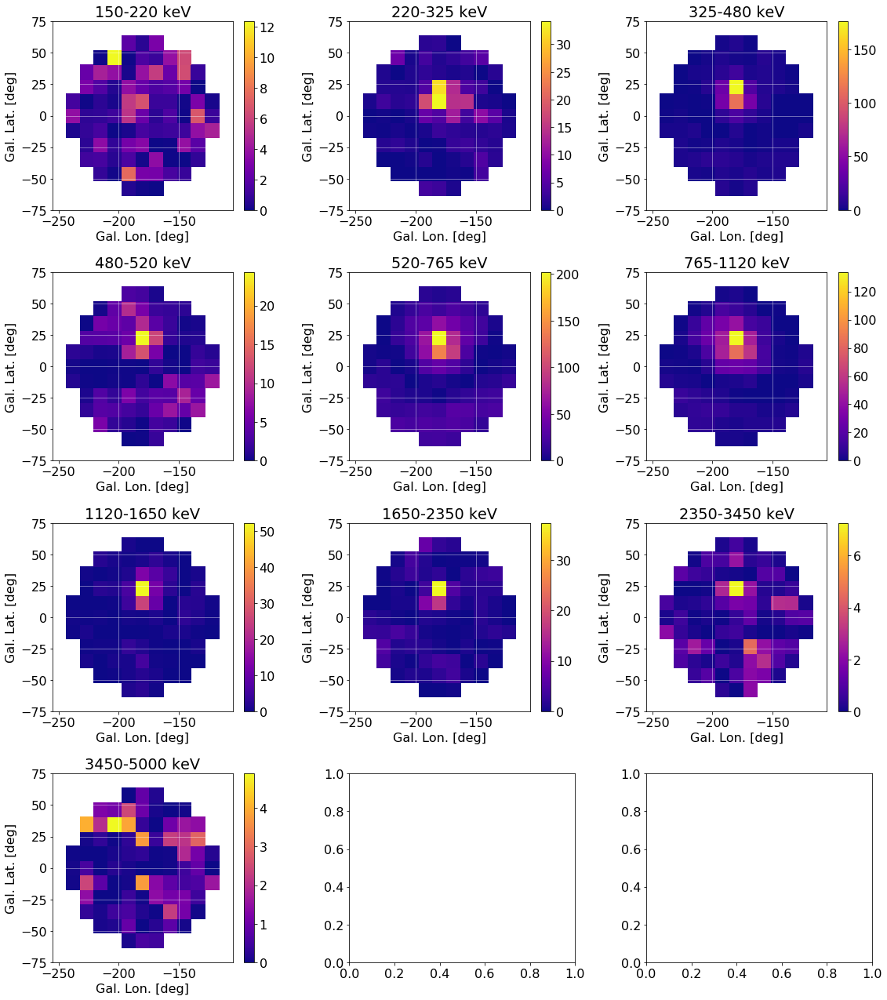

In [85]:
pc = result2.plot_TS_map_results()

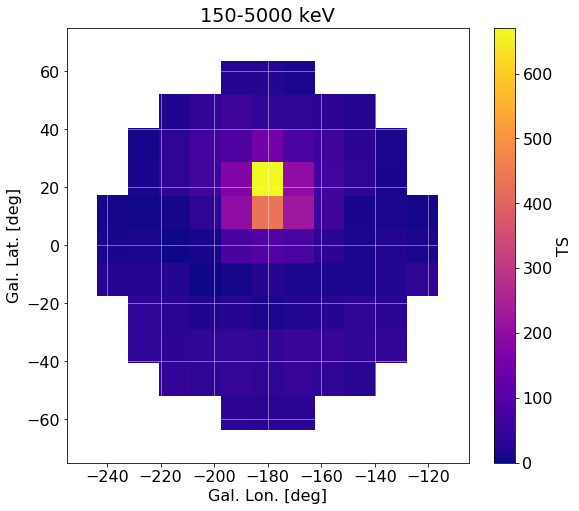

In [86]:
result2.plot_TS_map_results(mode='sum')

In [87]:
result3.TS_map([L_GRID,B_GRID],scipy=False)

Fitting background only...


Now fitting object at (l,b) = (-249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-249.2,-69.2)


Something went wrong with the fit, ignoring grid point  -249.23076923076923 -69.23076923076923
Now fitting object at (l,b) = (-237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-237.7,-69.2)


Something went wrong with the fit, ignoring grid point  -237.6923076923077 -69.23076923076923
Now fitting object at (l,b) = (-226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-226.2,-69.2)


Something went wrong with the fit, ignoring grid point  -226.15384615384616 -69.23076923076923
Now fitting object at (l,b) = (-214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-214.6,-69.2)


Something went wrong with the fit, ignoring grid point  -214.6153846153846 -69.23076923076923
Now fitting object at (l,b) = (-203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-203.1,-69.2)


Something went wrong with the fit, ignoring grid point  -203.07692307692307 -69.23076923076923
Now fitting object at (l,b) = (-191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-191.5,-69.2)


Something went wrong with the fit, ignoring grid point  -191.53846153846155 -69.23076923076923
Now fitting object at (l,b) = (-180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-180.0,-69.2)


Something went wrong with the fit, ignoring grid point  -180.0 -69.23076923076923
Now fitting object at (l,b) = (-168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-168.5,-69.2)


Something went wrong with the fit, ignoring grid point  -168.46153846153845 -69.23076923076923
Now fitting object at (l,b) = (-156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-156.9,-69.2)


Something went wrong with the fit, ignoring grid point  -156.9230769230769 -69.23076923076923
Now fitting object at (l,b) = (-145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-145.4,-69.2)


Something went wrong with the fit, ignoring grid point  -145.3846153846154 -69.23076923076923
Now fitting object at (l,b) = (-133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-133.8,-69.2)


Something went wrong with the fit, ignoring grid point  -133.84615384615384 -69.23076923076923
Now fitting object at (l,b) = (-122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-122.3,-69.2)


Something went wrong with the fit, ignoring grid point  -122.30769230769232 -69.23076923076923
Now fitting object at (l,b) = (-110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-110.8,-69.2)


Something went wrong with the fit, ignoring grid point  -110.76923076923077 -69.23076923076923
Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -57.69230769230769
Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -57.69230769230769
Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -57.69230769230769
Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -57.69230769230769
Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -57.69230769230769
Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -57.69230769230769
Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -57.69230769230769
Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -57.69230769230769
Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -57.69230769230769
Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -57.69230769230769
Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -46.153846153846146
Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -46.153846153846146
Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -46.153846153846146
Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -46.153846153846146
Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -46.153846153846146
Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -46.153846153846146
Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -34.61538461538461
Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -34.61538461538461
Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -34.61538461538461
Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -34.61538461538461
Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -23.076923076923077
Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -23.076923076923077
Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -23.076923076923077
Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -23.076923076923077
Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -11.538461538461537
Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -11.538461538461537
Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -3.552713678800501e-15
Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -3.552713678800501e-15
Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 11.538461538461544
Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 11.538461538461544
Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 23.076923076923077
Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 23.076923076923077
Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 23.076923076923077
Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 23.076923076923077
Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 34.61538461538461
Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 34.61538461538461
Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 34.61538461538461
Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 34.61538461538461
Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 46.15384615384616
Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 46.15384615384616
Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 46.15384615384616
Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 46.15384615384616
Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 46.15384615384616
Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 46.15384615384616
Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 57.69230769230769
Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 57.69230769230769
Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 57.69230769230769
Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 57.69230769230769
Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 57.69230769230769
Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 57.69230769230769
Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 57.69230769230769
Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 57.69230769230769
Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 57.69230769230769
Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 57.69230769230769
Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 69.23076923076923
Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 69.23076923076923
Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 69.23076923076923
Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 69.23076923076923
Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 69.23076923076923
Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 69.23076923076923
Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Something went wrong with the fit, ignoring grid point  180.0 69.23076923076923
Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 69.23076923076923
Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 69.23076923076923
Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 69.23076923076923
Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 69.23076923076923
Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 69.23076923076923
Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 69.23076923076923
Initial log joint probability = 3294.12
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       3294.26     0.0103235   0.000287272   0.0003712       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 25191.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       25191.8    0.00996298      0.179025   7.038e-05       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 51239.2
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       51240.5    0.00999759       1.25292   3.771e-05       0.001        3   
Optimization terminated normally: 
  C

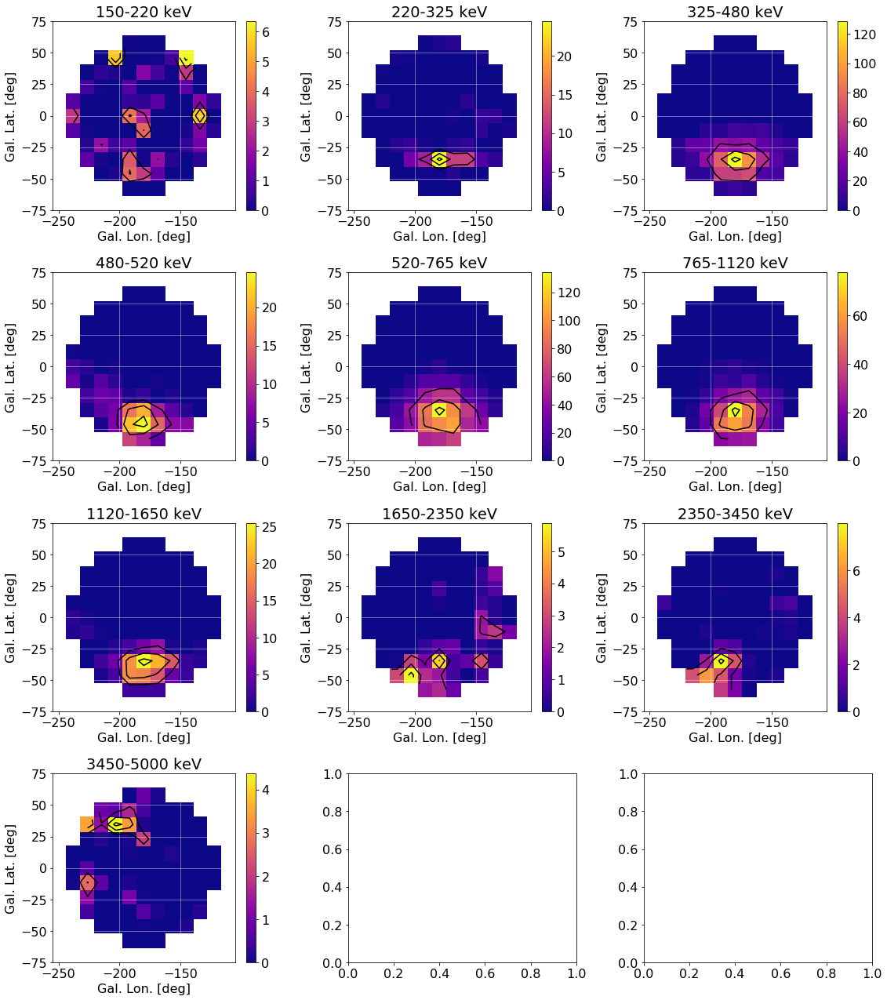

In [88]:
pc = result3.plot_TS_map_results()

In [89]:
result4.TS_map([L_GRID,B_GRID],scipy=False)

Fitting background only...


Now fitting object at (l,b) = (-249.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-249.2,-69.2)


Something went wrong with the fit, ignoring grid point  -249.23076923076923 -69.23076923076923
Now fitting object at (l,b) = (-237.7,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-237.7,-69.2)


Something went wrong with the fit, ignoring grid point  -237.6923076923077 -69.23076923076923
Now fitting object at (l,b) = (-226.2,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-226.2,-69.2)


Something went wrong with the fit, ignoring grid point  -226.15384615384616 -69.23076923076923
Now fitting object at (l,b) = (-214.6,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-214.6,-69.2)


Something went wrong with the fit, ignoring grid point  -214.6153846153846 -69.23076923076923
Now fitting object at (l,b) = (-203.1,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-203.1,-69.2)


Something went wrong with the fit, ignoring grid point  -203.07692307692307 -69.23076923076923
Now fitting object at (l,b) = (-191.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-191.5,-69.2)


Something went wrong with the fit, ignoring grid point  -191.53846153846155 -69.23076923076923
Now fitting object at (l,b) = (-180.0,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-180.0,-69.2)


Something went wrong with the fit, ignoring grid point  -180.0 -69.23076923076923
Now fitting object at (l,b) = (-168.5,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-168.5,-69.2)


Something went wrong with the fit, ignoring grid point  -168.46153846153845 -69.23076923076923
Now fitting object at (l,b) = (-156.9,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-156.9,-69.2)


Something went wrong with the fit, ignoring grid point  -156.9230769230769 -69.23076923076923
Now fitting object at (l,b) = (-145.4,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-145.4,-69.2)


Something went wrong with the fit, ignoring grid point  -145.3846153846154 -69.23076923076923
Now fitting object at (l,b) = (-133.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-133.8,-69.2)


Something went wrong with the fit, ignoring grid point  -133.84615384615384 -69.23076923076923
Now fitting object at (l,b) = (-122.3,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-122.3,-69.2)


Something went wrong with the fit, ignoring grid point  -122.30769230769232 -69.23076923076923
Now fitting object at (l,b) = (-110.8,-69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-110.8,-69.2)


Something went wrong with the fit, ignoring grid point  -110.76923076923077 -69.23076923076923
Now fitting object at (l,b) = (110.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -57.69230769230769
Now fitting object at (l,b) = (122.3,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -57.69230769230769
Now fitting object at (l,b) = (133.8,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -57.69230769230769
Now fitting object at (l,b) = (145.4,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 -57.69230769230769
Now fitting object at (l,b) = (156.9,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 -57.69230769230769
Now fitting object at (l,b) = (168.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-57.7)


Now fitting object at (l,b) = (180.0,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-57.7)


Now fitting object at (l,b) = (191.5,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-57.7)


Now fitting object at (l,b) = (203.1,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 -57.69230769230769
Now fitting object at (l,b) = (214.6,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 -57.69230769230769
Now fitting object at (l,b) = (226.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -57.69230769230769
Now fitting object at (l,b) = (237.7,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -57.69230769230769
Now fitting object at (l,b) = (249.2,-57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -57.69230769230769
Now fitting object at (l,b) = (110.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -46.153846153846146
Now fitting object at (l,b) = (122.3,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -46.153846153846146
Now fitting object at (l,b) = (133.8,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 -46.153846153846146
Now fitting object at (l,b) = (145.4,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-46.2)


Now fitting object at (l,b) = (156.9,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-46.2)


Now fitting object at (l,b) = (168.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-46.2)


Now fitting object at (l,b) = (180.0,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-46.2)


Now fitting object at (l,b) = (191.5,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-46.2)


Now fitting object at (l,b) = (203.1,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-46.2)


Now fitting object at (l,b) = (214.6,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-46.2)


Now fitting object at (l,b) = (226.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 -46.153846153846146
Now fitting object at (l,b) = (237.7,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -46.153846153846146
Now fitting object at (l,b) = (249.2,-46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -46.153846153846146
Now fitting object at (l,b) = (110.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -34.61538461538461
Now fitting object at (l,b) = (122.3,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -34.61538461538461
Now fitting object at (l,b) = (133.8,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-34.6)


Now fitting object at (l,b) = (145.4,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-34.6)


Now fitting object at (l,b) = (156.9,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-34.6)


Now fitting object at (l,b) = (168.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-34.6)


Now fitting object at (l,b) = (180.0,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-34.6)


Now fitting object at (l,b) = (191.5,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-34.6)


Now fitting object at (l,b) = (203.1,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-34.6)


Now fitting object at (l,b) = (214.6,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-34.6)


Now fitting object at (l,b) = (226.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-34.6)


Now fitting object at (l,b) = (237.7,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -34.61538461538461
Now fitting object at (l,b) = (249.2,-34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -34.61538461538461
Now fitting object at (l,b) = (110.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -23.076923076923077
Now fitting object at (l,b) = (122.3,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 -23.076923076923077
Now fitting object at (l,b) = (133.8,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-23.1)


Now fitting object at (l,b) = (145.4,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-23.1)


Now fitting object at (l,b) = (156.9,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-23.1)


Now fitting object at (l,b) = (168.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-23.1)


Now fitting object at (l,b) = (180.0,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-23.1)


Now fitting object at (l,b) = (191.5,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-23.1)


Now fitting object at (l,b) = (203.1,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-23.1)


Now fitting object at (l,b) = (214.6,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-23.1)


Now fitting object at (l,b) = (226.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-23.1)


Now fitting object at (l,b) = (237.7,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 -23.076923076923077
Now fitting object at (l,b) = (249.2,-23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -23.076923076923077
Now fitting object at (l,b) = (110.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -11.538461538461537
Now fitting object at (l,b) = (122.3,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-11.5)


Now fitting object at (l,b) = (133.8,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-11.5)


Now fitting object at (l,b) = (145.4,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-11.5)


Now fitting object at (l,b) = (156.9,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-11.5)


Now fitting object at (l,b) = (168.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-11.5)


Now fitting object at (l,b) = (180.0,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-11.5)


Now fitting object at (l,b) = (191.5,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-11.5)


Now fitting object at (l,b) = (203.1,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-11.5)


Now fitting object at (l,b) = (214.6,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-11.5)


Now fitting object at (l,b) = (226.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-11.5)


Now fitting object at (l,b) = (237.7,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-11.5)


Now fitting object at (l,b) = (249.2,-11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -11.538461538461537
Now fitting object at (l,b) = (110.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,-0.0)


Something went wrong with the fit, ignoring grid point  110.76923076923077 -3.552713678800501e-15
Now fitting object at (l,b) = (122.3,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,-0.0)


Now fitting object at (l,b) = (133.8,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,-0.0)


Now fitting object at (l,b) = (145.4,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,-0.0)


Now fitting object at (l,b) = (156.9,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-0.0)


Now fitting object at (l,b) = (168.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,-0.0)


Now fitting object at (l,b) = (180.0,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,-0.0)


Now fitting object at (l,b) = (191.5,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,-0.0)


Now fitting object at (l,b) = (203.1,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,-0.0)


Now fitting object at (l,b) = (214.6,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,-0.0)


Now fitting object at (l,b) = (226.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,-0.0)


Now fitting object at (l,b) = (237.7,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,-0.0)


Now fitting object at (l,b) = (249.2,-0.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,-0.0)


Something went wrong with the fit, ignoring grid point  249.23076923076923 -3.552713678800501e-15
Now fitting object at (l,b) = (110.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,11.5)


Something went wrong with the fit, ignoring grid point  110.76923076923077 11.538461538461544
Now fitting object at (l,b) = (122.3,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,11.5)


Now fitting object at (l,b) = (133.8,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,11.5)


Now fitting object at (l,b) = (145.4,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,11.5)


Now fitting object at (l,b) = (156.9,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,11.5)


Now fitting object at (l,b) = (168.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,11.5)


Now fitting object at (l,b) = (180.0,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,11.5)


Now fitting object at (l,b) = (191.5,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,11.5)


Now fitting object at (l,b) = (203.1,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,11.5)


Now fitting object at (l,b) = (214.6,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,11.5)


Now fitting object at (l,b) = (226.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,11.5)


Now fitting object at (l,b) = (237.7,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,11.5)


Now fitting object at (l,b) = (249.2,11.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,11.5)


Something went wrong with the fit, ignoring grid point  249.23076923076923 11.538461538461544
Now fitting object at (l,b) = (110.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,23.1)


Something went wrong with the fit, ignoring grid point  110.76923076923077 23.076923076923077
Now fitting object at (l,b) = (122.3,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,23.1)


Something went wrong with the fit, ignoring grid point  122.30769230769229 23.076923076923077
Now fitting object at (l,b) = (133.8,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,23.1)


Now fitting object at (l,b) = (145.4,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,23.1)


Now fitting object at (l,b) = (156.9,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,23.1)


Now fitting object at (l,b) = (168.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,23.1)


Now fitting object at (l,b) = (180.0,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,23.1)


Now fitting object at (l,b) = (191.5,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,23.1)


Now fitting object at (l,b) = (203.1,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,23.1)


Now fitting object at (l,b) = (214.6,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,23.1)


Now fitting object at (l,b) = (226.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,23.1)


Now fitting object at (l,b) = (237.7,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,23.1)


Something went wrong with the fit, ignoring grid point  237.69230769230768 23.076923076923077
Now fitting object at (l,b) = (249.2,23.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,23.1)


Something went wrong with the fit, ignoring grid point  249.23076923076923 23.076923076923077
Now fitting object at (l,b) = (110.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,34.6)


Something went wrong with the fit, ignoring grid point  110.76923076923077 34.61538461538461
Now fitting object at (l,b) = (122.3,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,34.6)


Something went wrong with the fit, ignoring grid point  122.30769230769229 34.61538461538461
Now fitting object at (l,b) = (133.8,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,34.6)


Now fitting object at (l,b) = (145.4,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,34.6)


Now fitting object at (l,b) = (156.9,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,34.6)


Now fitting object at (l,b) = (168.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,34.6)


Now fitting object at (l,b) = (180.0,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,34.6)


Now fitting object at (l,b) = (191.5,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,34.6)


Now fitting object at (l,b) = (203.1,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,34.6)


Now fitting object at (l,b) = (214.6,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,34.6)


Now fitting object at (l,b) = (226.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,34.6)


Now fitting object at (l,b) = (237.7,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,34.6)


Something went wrong with the fit, ignoring grid point  237.69230769230768 34.61538461538461
Now fitting object at (l,b) = (249.2,34.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,34.6)


Something went wrong with the fit, ignoring grid point  249.23076923076923 34.61538461538461
Now fitting object at (l,b) = (110.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,46.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 46.15384615384616
Now fitting object at (l,b) = (122.3,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,46.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 46.15384615384616
Now fitting object at (l,b) = (133.8,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,46.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 46.15384615384616
Now fitting object at (l,b) = (145.4,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,46.2)


Now fitting object at (l,b) = (156.9,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,46.2)


Now fitting object at (l,b) = (168.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,46.2)


Now fitting object at (l,b) = (180.0,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,46.2)


Now fitting object at (l,b) = (191.5,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,46.2)


Now fitting object at (l,b) = (203.1,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,46.2)


Now fitting object at (l,b) = (214.6,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,46.2)


Now fitting object at (l,b) = (226.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,46.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 46.15384615384616
Now fitting object at (l,b) = (237.7,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,46.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 46.15384615384616
Now fitting object at (l,b) = (249.2,46.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,46.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 46.15384615384616
Now fitting object at (l,b) = (110.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,57.7)


Something went wrong with the fit, ignoring grid point  110.76923076923077 57.69230769230769
Now fitting object at (l,b) = (122.3,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,57.7)


Something went wrong with the fit, ignoring grid point  122.30769230769229 57.69230769230769
Now fitting object at (l,b) = (133.8,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,57.7)


Something went wrong with the fit, ignoring grid point  133.84615384615384 57.69230769230769
Now fitting object at (l,b) = (145.4,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,57.7)


Something went wrong with the fit, ignoring grid point  145.3846153846154 57.69230769230769
Now fitting object at (l,b) = (156.9,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,57.7)


Something went wrong with the fit, ignoring grid point  156.92307692307693 57.69230769230769
Now fitting object at (l,b) = (168.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,57.7)


Now fitting object at (l,b) = (180.0,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,57.7)


Now fitting object at (l,b) = (191.5,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,57.7)


Now fitting object at (l,b) = (203.1,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,57.7)


Something went wrong with the fit, ignoring grid point  203.0769230769231 57.69230769230769
Now fitting object at (l,b) = (214.6,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,57.7)


Something went wrong with the fit, ignoring grid point  214.6153846153846 57.69230769230769
Now fitting object at (l,b) = (226.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,57.7)


Something went wrong with the fit, ignoring grid point  226.15384615384616 57.69230769230769
Now fitting object at (l,b) = (237.7,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,57.7)


Something went wrong with the fit, ignoring grid point  237.69230769230768 57.69230769230769
Now fitting object at (l,b) = (249.2,57.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,57.7)


Something went wrong with the fit, ignoring grid point  249.23076923076923 57.69230769230769
Now fitting object at (l,b) = (110.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (110.8,69.2)


Something went wrong with the fit, ignoring grid point  110.76923076923077 69.23076923076923
Now fitting object at (l,b) = (122.3,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (122.3,69.2)


Something went wrong with the fit, ignoring grid point  122.30769230769229 69.23076923076923
Now fitting object at (l,b) = (133.8,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (133.8,69.2)


Something went wrong with the fit, ignoring grid point  133.84615384615384 69.23076923076923
Now fitting object at (l,b) = (145.4,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (145.4,69.2)


Something went wrong with the fit, ignoring grid point  145.3846153846154 69.23076923076923
Now fitting object at (l,b) = (156.9,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,69.2)


Something went wrong with the fit, ignoring grid point  156.92307692307693 69.23076923076923
Now fitting object at (l,b) = (168.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (168.5,69.2)


Something went wrong with the fit, ignoring grid point  168.46153846153845 69.23076923076923
Now fitting object at (l,b) = (180.0,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (180.0,69.2)


Something went wrong with the fit, ignoring grid point  180.0 69.23076923076923
Now fitting object at (l,b) = (191.5,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (191.5,69.2)


Something went wrong with the fit, ignoring grid point  191.53846153846155 69.23076923076923
Now fitting object at (l,b) = (203.1,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.1,69.2)


Something went wrong with the fit, ignoring grid point  203.0769230769231 69.23076923076923
Now fitting object at (l,b) = (214.6,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (214.6,69.2)


Something went wrong with the fit, ignoring grid point  214.6153846153846 69.23076923076923
Now fitting object at (l,b) = (226.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (226.2,69.2)


Something went wrong with the fit, ignoring grid point  226.15384615384616 69.23076923076923
Now fitting object at (l,b) = (237.7,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (237.7,69.2)


Something went wrong with the fit, ignoring grid point  237.69230769230768 69.23076923076923
Now fitting object at (l,b) = (249.2,69.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (249.2,69.2)


Something went wrong with the fit, ignoring grid point  249.23076923076923 69.23076923076923
Initial log joint probability = 2564.94
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       2565.06    0.00995037   8.26172e-05   0.0004295       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 21024.1
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       21024.8    0.00996011      0.123193   7.907e-05       0.001        3   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = 44200.9
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       1       44202.1    0.00998915      0.934481    4.15e-05       0.001        3   
Optimization terminated normally: 
  C

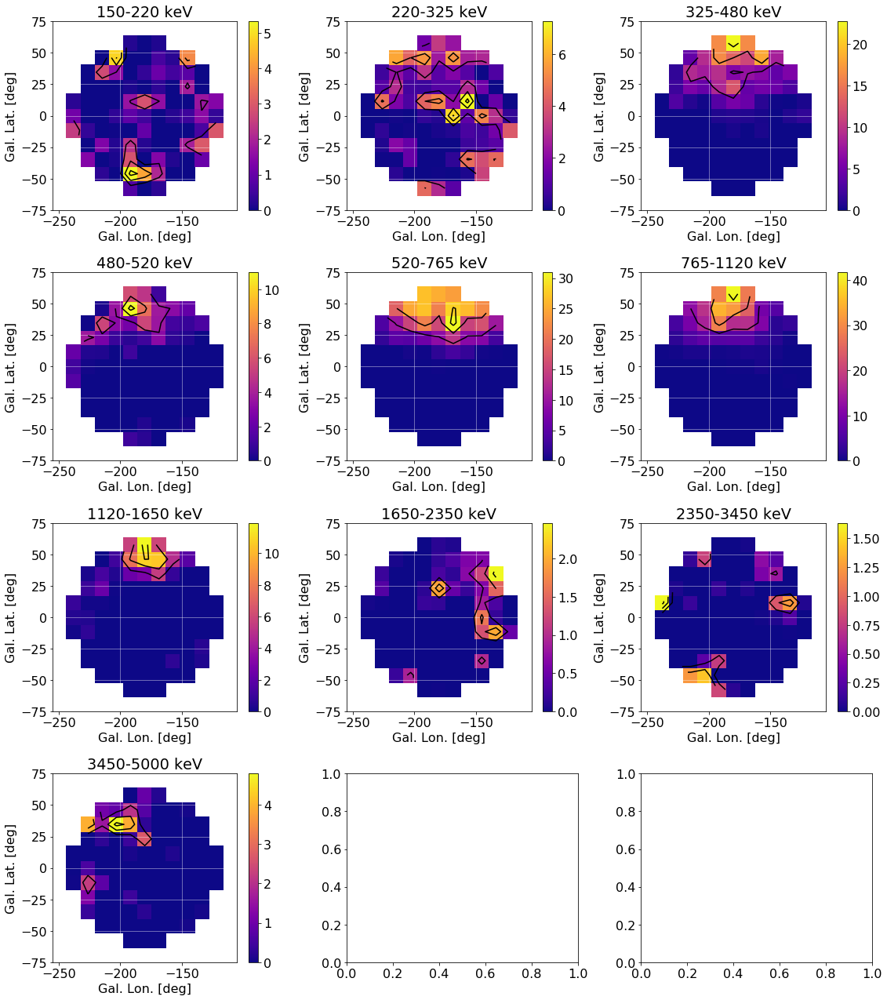

In [90]:
pc = result4.plot_TS_map_results()

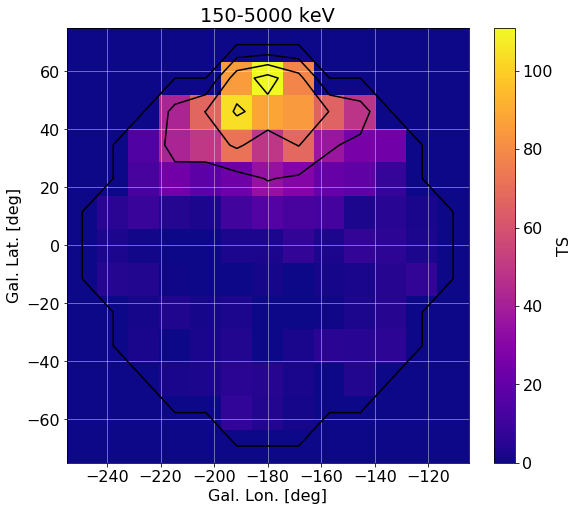

In [91]:
result4.plot_TS_map_results(mode='sum')